# Assignment 2: Milestone I Natural Language Processing
## Task 2&3
#### Student Name: Pallavi Kollipara
#### Student ID: s4015344

Date: 11-05-2024

Version: 1.0

Environment: Python 3 and Jupyter notebook

Libraries used: please include all the libraries you used in your assignment, e.g.,:
* pandas
* re
* numpy

## Introduction

The introduction and requirements for both Task 2 and Task 3 along with the necessity of loading `vocab.txt` and `processed_job_ads.txt`.

**Task 2: Job Advertisement Description Processing**

Task 2 involves processing job advertisement descriptions to generate feature representations for machine learning models. The goal is to extract meaningful information from the text data to facilitate classification tasks. Key steps include:

1. **Vocabulary Generation**: Extracting a vocabulary from the job advertisement descriptions. This involves identifying unique words and assigning indices to them. The vocabulary serves as a basis for feature representation.

2. **Feature Representation**: Generating feature representations for the job advertisement descriptions. This can be done using techniques like Term Frequency-Inverse Document Frequency (TF-IDF) or Word Embeddings. These representations capture the semantic meaning and importance of words within the descriptions.

**Task 3: Job Advertisement Classification**

Task 3 focuses on building machine learning models for classifying job advertisement categories based on their textual content. The task involves comparing different language models and exploring the impact of additional information (such as job titles) on classification accuracy. Key steps include:

1. **Model Comparison**: Experimenting with different language models (such as TF-IDF and Word Embeddings) to determine which performs best for classification tasks.

2. **Incorporating Additional Information**: Investigating whether including additional information, such as job titles, improves classification accuracy. This involves comparing models trained with only job descriptions, only job titles, and both combined.

**Importance of Loading `vocab.txt` and `processed_job_ads.txt`**

For both Task 2 and Task 3, it's essential to load two important files:

1. **vocab.txt**: This file contains the vocabulary generated from the job advertisement descriptions in Task 2. It includes unique words and their corresponding indices, necessary for feature representation.

2. **processed_job_ads.txt**: This file contains preprocessed job advertisement data, including titles, descriptions, categories, web indices, and company names. Loading this file provides access to the actual job advertisement texts, crucial for generating document representations and conducting classification tasks.

By loading and processing these files, we ensure that we have the necessary data and vocabulary required for conducting experiments and building machine learning models effectively for job advertisement processing and classification.

## Importing libraries 

In [1]:
import pandas as pd
import numpy as np 
import re
import gensim.downloader as api
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, cross_val_score

In [2]:
vocab = {}

with open('vocab.txt', 'r') as f:
    for line in f:
        word, index = line.strip().split(':')
        vocab[word] = int(index)

vocab

{'aap': 0,
 'aaron': 1,
 'aat': 2,
 'abb': 3,
 'abenefit': 4,
 'aberdeen': 5,
 'abi': 6,
 'abilities': 7,
 'abreast': 8,
 'abroad': 9,
 'absence': 10,
 'absolute': 11,
 'ac': 12,
 'aca': 13,
 'academic': 14,
 'academy': 15,
 'acca': 16,
 'accept': 17,
 'acceptable': 18,
 'acceptance': 19,
 'accepted': 20,
 'access': 21,
 'accessible': 22,
 'accident': 23,
 'accommodates': 24,
 'accommodation': 25,
 'accomplished': 26,
 'accordance': 27,
 'account': 28,
 'accountabilities': 29,
 'accountability': 30,
 'accountable': 31,
 'accountancy': 32,
 'accountant': 33,
 'accountants': 34,
 'accounting': 35,
 'accounts': 36,
 'accreditation': 37,
 'accredited': 38,
 'accruals': 39,
 'accuracy': 40,
 'accurate': 41,
 'accurately': 42,
 'achievable': 43,
 'achieve': 44,
 'achieved': 45,
 'achievement': 46,
 'achievements': 47,
 'achiever': 48,
 'achieving': 49,
 'acii': 50,
 'acquired': 51,
 'acquisition': 52,
 'acquisitions': 53,
 'act': 54,
 'acting': 55,
 'action': 56,
 'actions': 57,
 'actionscri

In [3]:
job_ads = []

with open('processed_job_ads.txt', 'r') as f:
    current_job = {}
    for line in f:
        line = line.strip()
        if line.startswith("Title:"):
            if current_job:
                job_ads.append(current_job)
                current_job = {}
            current_job['title'] = line[len("Title:"):].strip()
        elif line.startswith("Category:"):
            current_job['Category'] = line[len("Category:"):].strip()
        elif line.startswith("Webindex:"):
            current_job['webindex'] = line[len("Webindex:"):].strip()
        elif line.startswith("Company:"):
            current_job['company'] = line[len("Company:"):].strip()
        elif line.startswith("Description:"):
            current_job['description'] = line[len("Description:"):].strip()

    if current_job:
        job_ads.append(current_job)



In [4]:
descriptions = [job['description'] for job in job_ads]


In [5]:
tokenized_descriptions = [description.split() for description in descriptions]


## Task 2. Generating Feature Representations for Job Advertisement Descriptions

This task is to generate different types of feature representations for the collection of job advertisement descriptions. These feature representations will be used for various natural language processing tasks, such as text classification, clustering, or information retrieval.

The task involves generating the following feature representations:

1. **Bag-of-Words Model (Count Vector Representation)**
   - You need to generate the count vector representation for each job advertisement description.
   - The count vector representation is a sparse vector where each element corresponds to a word in the vocabulary (generated in Task 1).
   - The value of each element is the count of the corresponding word in the job advertisement description.
   - The count vectors should be saved in the `count_vectors.txt` file, following the specified format.

2. **Word Embedding Models**
   - You need to generate feature representations based on pre-trained word embedding models, such as FastText, Word2Vec (GoogleNews-300), or GloVe.
   - For each job advertisement description, you need to create two types of document embeddings:
     - **TF-IDF Weighted Document Embedding**: In this representation, the word embeddings are weighted by the Term Frequency-Inverse Document Frequency (TF-IDF) values of the corresponding words.
     - **Unweighted Document Embedding**: In this representation, the word embeddings are averaged without any weighting.

### Bag-of-words model:

The bag-of-words model is a simple technique for representing text data as numerical feature vectors. It involves counting the occurrences of each word in a document and using those counts as features. Here are the steps to generate the count vector representation for job advertisement descriptions using the bag-of-words model:

1. Load the vocabulary from the `vocab.txt` file generated in Task 1. This will be the set of unique words (features) used to represent each document.

2. For each job advertisement description:
   - Tokenize the text into individual words
   - Count the occurrences of each word from the vocabulary in the tokenized text
   - Create a vector with length equal to the vocabulary size, where each element corresponds to the count of the respective word

3. Save the count vectors for all job advertisement descriptions in the `count_vectors.txt` file using the specified format:
   - Start each line with `#` followed by the `webindex` of the job advertisement and a comma `,`
   - Represent the count vector as a comma-separated list of `word_index:word_count` pairs
   - `word_index` is the index of the word in the vocabulary (0-based indexing)
   - `word_count` is the number of occurrences of that word in the document

In [6]:
def generate_count_vector(description):
    count_vector = {}
    for word in description.split():
        if word in vocab:
            index = vocab[word]
            count_vector[index] = count_vector.get(index, 0) + 1
    return count_vector

### Models based on word embeddings:

this task is related to generating feature representations based on word embeddings.

For this part of the task, we need to choose one pre-trained word embedding model, such as FastText, Word2Vec (GoogleNews-300), or GloVe. And I have loaded the Word2Vec (GoogleNews-300) model.

Using the chosen word embedding model (Word2Vec in your case),generate two types of document embeddings for each job advertisement description:

1. **TF-IDF Weighted Document Embedding**:
   - In this representation, you need to weight the word embeddings by the Term Frequency-Inverse Document Frequency (TF-IDF) values of the corresponding words.
   - TF-IDF is a statistical measure that reflects how important a word is to a document in a corpus.
   - Words that appear frequently in a document but rarely across the corpus will have higher TF-IDF values.
   - By weighting the word embeddings with TF-IDF, you can give more importance to the most relevant words in the document.

2. **Unweighted Document Embedding**:
   - In this representation, you need to average the word embeddings of all the words in the document without any weighting.
   - This approach treats all words equally, regardless of their importance or frequency.


In [7]:
W2V = api.load('word2vec-google-news-300')


In [8]:
print(W2V)

KeyedVectors<vector_size=300, 3000000 keys>


In [9]:
vec_abs = W2V['absolute']
vec_abs

array([ 1.50390625e-01, -1.15722656e-01,  2.04101562e-01,  9.66796875e-02,
       -1.08886719e-01,  2.38281250e-01,  2.89062500e-01, -3.32031250e-01,
        8.83789062e-02,  3.02734375e-01, -3.22265625e-01, -2.25585938e-01,
        3.97949219e-02,  1.32812500e-01, -2.04101562e-01,  8.93554688e-02,
        2.77343750e-01, -4.46777344e-02, -8.00781250e-02, -7.61718750e-02,
        6.07910156e-02,  2.58789062e-02, -1.41601562e-01,  7.56835938e-02,
        1.60156250e-01, -7.47070312e-02, -3.10546875e-01,  2.37304688e-01,
       -4.41894531e-02,  1.44531250e-01,  1.54418945e-02, -5.54199219e-02,
       -6.73828125e-02,  3.28125000e-01, -1.24023438e-01,  1.32812500e-01,
       -2.01416016e-02, -9.17968750e-02, -1.19140625e-01,  2.19726562e-01,
        2.34375000e-01, -7.03125000e-02,  4.34570312e-02, -2.08007812e-01,
       -1.56250000e-01, -1.71875000e-01,  1.53320312e-01,  1.19628906e-01,
       -4.24804688e-02, -1.71875000e-01, -3.46374512e-03,  1.34765625e-01,
       -2.55859375e-01,  

### Generating TF-IDF Vectors

The code is an implementation of generating the TF-IDF weighted document embeddings for the job advertisement descriptions.



This is a custom function `get_weighted_vector` that takes three arguments:
- `data_features`: The TF-IDF vector representation of the documents (`tfidf_features` in your case)
- `vocab`: The vocabulary list generated in Task 1
- `descriptions`: The list of job advertisement descriptions

The function iterates over each job advertisement description and constructs a vector representation by combining the TF-IDF values of the words present in the description. Here's how it works:

1. For each description, it initializes an empty list `vector_representation`.
2. It then iterates over each word in the vocabulary and its corresponding TF-IDF value in the current description's TF-IDF vector.
3. If the TF-IDF value is non-zero (i.e., the word is present in the description), it appends the TF-IDF value (as a string) to the `vector_representation` list.
4. After iterating over all words in the vocabulary, it prints the `vector_representation` list as an array-like string.

It imports the `TfidfVectorizer` class from scikit-learn, initializes it with the vocabulary from Task 1, and generates the TF-IDF vector representation (`tfidf_features`) for the job advertisement descriptions.

The output of this function will be a list of TF-IDF weighted document embeddings, where each embedding is represented as a vector of TF-IDF values for the words present in the corresponding job advertisement description.


In [10]:
def get_weighted_vector(data_features, vocab, descriptions):
    for d_ind, description in enumerate(descriptions):
        vector_representation = []
        for word, value in zip(vocab, data_features.toarray()[d_ind]):
            if value != 0:
                vector_representation.append(str(value))
        print("[" + ", ".join(vector_representation) + "]")

In [11]:
from sklearn.feature_extraction.text import TfidfVectorizer
tVectorizer = TfidfVectorizer(analyzer = "word",vocabulary = vocab) # initialised the TfidfVectorizer
tfidf_features = tVectorizer.fit_transform(descriptions) # generate the tfidf vector representation for all articles
tfidf_features.shape

(776, 5168)

In [12]:
tfidf_features

<776x5168 sparse matrix of type '<class 'numpy.float64'>'
	with 62700 stored elements in Compressed Sparse Row format>

In [13]:
tfidf_name = tVectorizer.get_feature_names_out()

In [14]:
get_weighted_vector(tfidf_features, vocab, descriptions)

[0.35106185634121084, 0.27498642357138875, 0.13538677193538917, 0.10381438219239907, 0.13391268330711703, 0.11952118894034722, 0.1538326433873238, 0.07045034890364907, 0.09554685177497566, 0.17589759839471428, 0.25274549376401695, 0.10590537162929867, 0.18843292868380723, 0.08314792747623503, 0.20564660743480745, 0.07903543423856024, 0.12867304844318694, 0.10645278680180173, 0.24452050728866742, 0.08824056238987174, 0.27388115772122074, 0.12867304844318694, 0.1688061602552218, 0.09750260130289759, 0.1325105307054478, 0.16024543818617706, 0.11546681185518241, 0.07207442096808514, 0.17375260346753055, 0.1385832217997621, 0.08194530733614618, 0.09068786390134359, 0.11952118894034722, 0.10997618476159289, 0.08266082382140266, 0.13694057886061037, 0.0784037950186028, 0.14218021372454046, 0.12528814919782702, 0.20662914170649252, 0.1311736186031306]
[0.14990696056775776, 0.19706428018101743, 0.21904220184292927, 0.06890657499859155, 0.04394917696067669, 0.07655513337830924, 0.056332539131418

[0.14144503262260386, 0.11030579462462566, 0.15360489994271928, 0.16265709555556057, 0.16866038158154636, 0.09625720480916755, 0.07949801765845634, 0.0632800802392616, 0.2936874517239813, 0.12279712297654996, 0.08550130368444214, 0.10354462054389704, 0.0996549160669821, 0.08179447473898012, 0.14684372586199065, 0.0771571291115671, 0.10125359901178438, 0.06551167988798051, 0.33732076316309273, 0.1577520537217685, 0.06826555037441769, 0.14400918590950665, 0.1577520537217685, 0.09625720480916755, 0.13695073535908991, 0.30720979988543856, 0.15360489994271928, 0.22217130696472231, 0.11445294840367491, 0.315504107443537, 0.06992677224609306, 0.07339707908689047, 0.12973356312841508, 0.3527999267356448, 0.09718499491414, 0.16866038158154636, 0.07262836259699669]
[0.06040949297149922, 0.08015095565200235, 0.0449009486775868, 0.03431472027510191, 0.11062510822247065, 0.04355420255138784, 0.06650281271432501, 0.03978781466252371, 0.056502431046245284, 0.056502431046245284, 0.06961796495595357, 0

[0.04098159812623572, 0.13181406417251165, 0.07863082516920443, 0.0900848481386767, 0.05530447375528245, 0.03565233471632064, 0.1106089475105649, 0.1086395016413389, 0.04867298650300726, 0.048143035940759075, 0.05520954751076847, 0.03596544264194601, 0.04178707890552518, 0.03091267127472224, 0.033820160311712345, 0.06774364484387035, 0.05259378630327657, 0.05530447375528245, 0.08414031765511525, 0.048143035940759075, 0.06774364484387035, 0.05898955753352474, 0.06477137960208963, 0.18940493127407493, 0.08933336380895604, 0.02466795201601572, 0.06246591156980581, 0.025441815166227066, 0.08593828086680688, 0.06477137960208963, 0.06246591156980581, 0.06246591156980581, 0.025327650791141576, 0.1354872896877407, 0.048143035940759075, 0.07614821817849121, 0.0272568698141086, 0.039315412584602215, 0.2032309345316111, 0.04124317591601056, 0.19338065046975944, 0.03248908860566494, 0.04504242406933835, 0.04867298650300726, 0.04430412643039392, 0.035807702618880076, 0.0556385637856193, 0.039315412

[0.1670983782724369, 0.1525412877619598, 0.1137572919228868, 0.08294128103216443, 0.06985895001481557, 0.08420803097771982, 0.14098667498812056, 0.0670292305897959, 0.06394181335214977, 0.08664054608528592, 0.10667684347357151, 0.14295277736843762, 0.1024472916508894, 0.11684107408412127, 0.06970280068444984, 0.13579102449452568, 0.11851786249226885, 0.08172845197590466, 0.10148119297997661, 0.0757520079422165, 0.08749982268652713, 0.09328306474974392, 0.13007247526610813, 0.07231007451452569, 0.11851786249226885, 0.19840040282481944, 0.14506464570079802, 0.13007247526610813, 0.21810596863296153, 0.09292905794277519, 0.33699640767405753, 0.09089267887705013, 0.07966751695735423, 0.09964202702998828, 0.09328306474974392, 0.1123321358913525, 0.17865299104627613, 0.08125741345828909, 0.0819669235055235, 0.1554912610771391, 0.08992658020613736, 0.14506464570079802, 0.10344729536029369, 0.11766713718336202, 0.12759289626429293, 0.16270551837250957, 0.2627963291891967, 0.0839501361724492, 0.

[0.03569184611436886, 0.08876058778475471, 0.054943374712775744, 0.051285255465981096, 0.050420950456830226, 0.10169019661287895, 0.0330658344600972, 0.07647084616096034, 0.027845846914057424, 0.04233692706736164, 0.1044375519851092, 0.05624057487596935, 0.03224865186032233, 0.05001168809801566, 0.07051319906048713, 0.04748992545476276, 0.04488745120596626, 0.07647084616096034, 0.0577003251332267, 0.06242917567101855, 0.16483012413832723, 0.056947626530346476, 0.055573948844231336, 0.05850497384629879, 0.07647084616096034, 0.07051319906048713, 0.052715139431745654, 0.03862287111643632, 0.043658654643284896, 0.07311567330928362, 0.10257051093196219, 0.03374353100092881, 0.07647084616096034, 0.04850472004162929, 0.07647084616096034, 0.16535800293827121, 0.028526626807307373, 0.0374700538482357, 0.06838682277149177, 0.05936927885544969, 0.06838682277149177, 0.045417668893760046, 0.07311567330928362, 0.056947626530346476, 0.043201232076512525, 0.2435990900962566, 0.07647084616096034, 0.041

[0.04229559137605246, 0.0644413893968156, 0.08533408416286677, 0.17067275263678644, 0.048315224172257094, 0.04957344948794852, 0.08036661675705432, 0.05343537746355515, 0.03475035754427776, 0.11705776094106464, 0.11901238006831288, 0.057113740010435295, 0.03018250071693612, 0.052143980449096405, 0.04717422088775751, 0.06998134177591347, 0.05540068693745682, 0.054879036500822244, 0.043854124124012, 0.04664122668796866, 0.052143980449096405, 0.053897958218569915, 0.06690099711030474, 0.048019862043753185, 0.05984879606216115, 0.04638317641541156, 0.03233576249692439, 0.04564010435347619, 0.08036661675705432, 0.03249919072095607, 0.05984879606216115, 0.061485481690502775, 0.0644413893968156, 0.04540209813315923, 0.050975769750066, 0.08533408416286677, 0.13348128455904418, 0.07187075667164364, 0.06690099711030474, 0.0606398405345071, 0.07410546018125667, 0.06560960009584599, 0.04141341685407266, 0.06690099711030474, 0.040750718425799276, 0.03185815914508689, 0.04664122668796866, 0.05298962

[0.08154228260453314, 0.11941603506368186, 0.08528414040978352, 0.07099457786505531, 0.041485991722107186, 0.03520557718183127, 0.07626843023479422, 0.052606781239878525, 0.06962416202885291, 0.054495152079565214, 0.046537498158550065, 0.03752178798356076, 0.03105509141417335, 0.04209819508735923, 0.11246396853786417, 0.06621161093573255, 0.15727974440768444, 0.047216274093942766, 0.17056828081956704, 0.06272232262676036, 0.05577555426683542, 0.04047942955157019, 0.06509049919068921, 0.06725272005980491, 0.05936875993569444, 0.042577031503884984, 0.05192204839100431, 0.06272232262676036, 0.07426340461891069, 0.05296315751507668, 0.1452982802460964, 0.15727974440768444, 0.029184853743964154, 0.16308456520906628, 0.0343143436954878, 0.07252657242954383, 0.10318548335774859, 0.06621161093573255, 0.09307499631710013, 0.05065207259335818, 0.035771184569657534, 0.06306617956586467, 0.06725272005980491, 0.08528414040978352, 0.11647401976963119, 0.08614834355016536, 0.04178849187609083, 0.0419

[0.10820592281841582, 0.14632908921138638, 0.16134458924633008, 0.11592412886580088, 0.11231664105263989, 0.1101755425293837, 0.21276467959419446, 0.10160472139611064, 0.102339316543619, 0.0818114310545033, 0.05521329308015086, 0.08976937423806143, 0.09760560022382614, 0.25446378287006505, 0.1442882403406813, 0.26343659607024744, 0.1487746469407725, 0.09470730011143319, 0.09114957391276704, 0.11725456692601165, 0.2885764806813626, 0.13431091583166044, 0.16134458924633008, 0.10917103122054528, 0.26343659607024744, 0.0952602921469911, 0.07555546365014106, 0.05952455936806134, 0.059920392728898784, 0.11866107030175943, 0.13431091583166044, 0.08932599089144842, 0.16697206021843855, 0.1101755425293837, 0.11122281164217222, 0.06879232433570638, 0.09416646273652343, 0.08804185032369446, 0.20247607075443924, 0.0776509512057844, 0.06395866603351912, 0.09699798639007563, 0.10551884383109297, 0.11231664105263989, 0.07658090827371013, 0.08804185032369446, 0.1101755425293837, 0.09261181255578985, 0

[0.08408984925088832, 0.07110879595279691, 0.08206145304576858, 0.04882558246080224, 0.11291817267110084, 0.06628158599647511, 0.07784008567403382, 0.29974413627991386, 0.06161672296277686, 0.10412100802892174, 0.050888734405515605, 0.11451263834051864, 0.04050721378098359, 0.05573898311192681, 0.0386414207683533, 0.06446712376141037, 0.40565168194238627, 0.09054261867302699, 0.10412100802892174, 0.14121917631099137, 0.043090662528500065, 0.09602685785999726, 0.3597026252346456, 0.06666860145480906, 0.0613272797944805, 0.05185467708705831, 0.06628158599647511, 0.17676112397343152, 0.06021583203267038, 0.06666860145480906, 0.06628158599647511, 0.09218399941981277, 0.09399846165487753, 0.06919332777936829, 0.057715585403950755, 0.056159039622430906, 0.06788473928444912, 0.43942729367500233, 0.05968589904769471, 0.07640413237051934, 0.060762591069911207, 0.052530115152301396, 0.046983366048701534, 0.10719140027135714, 0.05573898311192681, 0.14221759190559383, 0.07060958815549569, 0.187546

[0.07176316494609494, 0.08731712157520577, 0.09484226596672612, 0.30750944790200513, 0.0701611088300199, 0.13650026629352113, 0.09131821463776536, 0.05598774853937105, 0.10812398985426269, 0.057744151155599124, 0.0729784399126305, 0.14700870633101168, 0.07348275093251193, 0.10055509627353482, 0.0816291582469877, 0.14700870633101168, 0.055156537921139746, 0.11307909483176252, 0.09025214203214679, 0.11450071545446402, 0.06555624138120861, 0.061863699594189824, 0.0816291582469877, 0.08430110083526099, 0.05735654632065514, 0.0753384861694635, 0.10812398985426269, 0.10055509627353482, 0.15531275472493714, 0.111738755256172, 0.09899121297821802, 0.07618107592590836, 0.09614535444852042, 0.06007050331157293, 0.09301410223043881, 0.056230751321359594, 0.06610802115943211, 0.10055509627353482, 0.10137797223427181, 0.22615818966352505, 0.10926809766871264, 0.09301410223043881, 0.06466451573942268, 0.056230751321359594, 0.10137797223427181, 0.36986133437762536, 0.21624797970852538, 0.348042345866

[0.08928999392917086, 0.07965427931643736, 0.32358945650941795, 0.07321943186591741, 0.06650671857391319, 0.06961220003681926, 0.1466625569565059, 0.10110176004990416, 0.11973219850773371, 0.1277102724770569, 0.2901052841475381, 0.08328948852578173, 0.08511645558409137, 0.13523645405500584, 0.09108038221793745, 0.11973219850773371, 0.0723959801329912, 0.11066279041098158, 0.07620625038426046, 0.08119750583524059, 0.10537526688581265, 0.1122060169297848, 0.1466625569565059, 0.09302664509284007, 0.05422724030614015, 0.1277102724770569, 0.11193568932057539, 0.07212809773848845, 0.1442561954769769, 0.0723959801329912, 0.10014979031468958, 0.11760030873686433, 0.17318359528464025, 0.11891802652735596, 0.09515853486370948, 0.1122060169297848, 0.10786315216980599, 0.1277102724770569, 0.10313660883303265, 0.13523645405500584, 0.10921919841144176, 0.06378029778793488, 0.07009324895535995, 0.13523645405500584, 0.07652809640587992, 0.09371494286416965, 0.11386365757319512, 0.06288186727750719, 0.

[0.13389324127118143, 0.07119278285304842, 0.078205814796062, 0.09548083621349769, 0.10710219442527887, 0.1118977287316492, 0.27468243080929744, 0.06186732060196129, 0.09595477008509835, 0.15902569403943512, 0.07233655515178455, 0.13599857405449572, 0.16900953008242436, 0.34492349082326773, 0.10939082145729709, 0.11371242189206679, 0.1018240297293758, 0.10008916248226528, 0.12391167062315313, 0.06404909866546091, 0.13389324127118143, 0.1334829752147836, 0.07724925053492863, 0.16489495368371257, 0.10568008494458404, 0.0857726065239833, 0.1677860973482106, 0.17246174541163387, 0.32978990736742514, 0.06596554289376169, 0.1086056103640587, 0.1499995869108305, 0.18560736972202513, 0.08643020623154563, 0.08419712857233076, 0.1043309370037279, 0.21420438885055773, 0.06581306352038366, 0.10008916248226528, 0.13012931441021827, 0.08481604226284992, 0.07373702529086722, 0.07996837192702896, 0.3662530787245633, 0.07100689785149868]
[0.08909231043898087, 0.0844220389506072, 0.10917544320760318, 0.

[0.08811503518831354, 0.07354059477105679, 0.047586447786636225, 0.06497427563386172, 0.08486781394483171, 0.10099066721912184, 0.042523812041184425, 0.09208931279385393, 0.049247401758775296, 0.11677978043962399, 0.08486781394483171, 0.07637360181954968, 0.05262904181097669, 0.061998974292278235, 0.04189249099294743, 0.05524010944409313, 0.10168906017490295, 0.09208931279385393, 0.14604862984718495, 0.08129378706228717, 0.05153025419977418, 0.0631301739372028, 0.08486781394483171, 0.07252258012194668, 0.11165604546576119, 0.5838989021981199, 0.11677978043962399, 0.09208931279385393, 0.05107933371965844, 0.09258542863439083, 0.0430833473018103, 0.07252258012194668, 0.06563399578106265, 0.05830083256868066, 0.2033781203498059, 0.1986216232857523, 0.08299130021445071, 0.07518580125533098, 0.08129378706228717, 0.07203459322342648, 0.11677978043962399, 0.11677978043962399, 0.06530108127292446, 0.06372390917058993, 0.08811503518831354, 0.08129378706228717, 0.08050208305170024, 0.06703160723

[0.05281599775240076, 0.13281172450636977, 0.05410649735278101, 0.03962700601242326, 0.07549905333491604, 0.048549272958701324, 0.04014383144849812, 0.07939027986371473, 0.07067258704688434, 0.06168275101226009, 0.06411959351916488, 0.08967061549871921, 0.07152032573084531, 0.05708272254610021, 0.051628853199127446, 0.06987069504313778, 0.06411959351916488, 0.08468026478917381, 0.06910994422871027, 0.06977087257683967, 0.08468026478917381, 0.07337666902240972, 0.04146304623546553, 0.0809529226818888, 0.07939027986371473, 0.08468026478917381, 0.1619058453637776, 0.07986987037795566, 0.1353927237071303, 0.08468026478917381, 0.03627689876499902, 0.04765012559505673, 0.08468026478917381, 0.0779766974885696, 0.04553937830883536, 0.058463382845042884, 0.053839257884160406, 0.06987069504313778, 0.04765012559505673, 0.06411959351916488, 0.0809529226818888, 0.35868246199487686, 0.07067258704688434, 0.053318804861118875, 0.08967061549871921, 0.09298014436449886, 0.07067258704688434, 0.1098767641

[0.37127850294723425, 0.25353072379301594, 0.12705420673443238, 0.2638546295023755, 0.22750983782467793, 0.18327152942755467, 0.3090698981130235, 0.14267399857624205, 0.2372408091910812, 0.3157393286272267, 0.23380795741916605, 0.24281494999822137, 0.3157393286272267, 0.2801445441043103, 0.25121919009559707]
[0.12662541502197006, 0.12867895334826152, 0.15932506053449835, 0.23612540392862266, 0.17995623981959186, 0.1036118045609421, 0.09493483224572641, 0.17811084303673494, 0.08662982209695133, 0.10804777406316798, 0.14658918044869637, 0.07447520674991838, 0.1699413119184485, 0.0785235287172224, 0.09856915796982119, 0.09359687665979874, 0.11025356080347186, 0.17995623981959186, 0.09597930783573316, 0.11661048712082667, 0.12564944233916825, 0.12203719710573172, 0.07736372614516242, 0.11455694879453522, 0.10407327892174759, 0.11455694879453522, 0.19516070911978034, 0.08662982209695133, 0.08014376542503157, 0.17452952983468684, 0.11390275762457462, 0.15389835054959333, 0.07296569737470524,

[0.04759216827977324, 0.043304028402865014, 0.04693760894163498, 0.31103452747029275, 0.03945724007413688, 0.04905464932725913, 0.10383257980152343, 0.045207860998531, 0.045750142725987236, 0.11589519874539385, 0.05624274978879021, 0.05416829636317296, 0.07479574742068594, 0.023362436362707698, 0.0424785212438594, 0.036727900319465295, 0.055630777410658847, 0.04469490648878371, 0.05416829636317296, 0.04036148085823526, 0.11924754446756344, 0.04420826918696337, 0.39632216293672007, 0.11126155482131769, 0.053046186905400035, 0.028844570389247853, 0.03945724007413688, 0.02942560993636012, 0.0353272263138594, 0.04101604019637353, 0.15093387035987996, 0.03787233994266319, 0.06634610681157618, 0.03945724007413688, 0.03514300018799159, 0.04068311665550587, 0.03362853354537183, 0.06220690549405855, 0.030480846173563655, 0.04759216827977324, 0.3365243616267026, 0.07891448014827376, 0.3082174562694325, 0.13210738764557337, 0.027209224691435822, 0.033785352774835534, 0.03694600986482786, 0.036102

[0.04981253476353788, 0.06627826296944749, 0.08557654236781499, 0.06583229257055404, 0.06193837453087333, 0.08712789675846147, 0.04870050917164724, 0.09474811019114891, 0.051729677611073555, 0.10672484327608034, 0.06338616398266068, 0.05967854741955608, 0.10672484327608034, 0.048246240581744905, 0.0672086248306363, 0.0400816009019372, 0.15010291163812325, 0.0626461774064315, 0.09075998232147746, 0.09841018501070861, 0.10672484327608034, 0.05666075745057664, 0.0888428394739418, 0.03828547646549521, 0.07947769406923033, 0.042941078322721496, 0.07849091308288346, 0.07849091308288346, 0.10672484327608034, 0.0929334596212002, 0.07505145581906163, 0.0697977051672512, 0.11817318972891751, 0.05937988030030471, 0.09841018501070861, 0.07947769406923033, 0.08557654236781499, 0.04948698588539128, 0.10672484327608034, 0.15698182616576692, 0.10672484327608034, 0.10204227057372461, 0.06193837453087333, 0.06126007216418149, 0.05879850059475834, 0.04169637775477976, 0.08165117136895304, 0.0855765423678

[0.1000708196572236, 0.23420219892519037, 0.06674309500905264, 0.08610570615217483, 0.09785815199950204, 0.15027849843307392, 0.10389973990789496, 0.11462754746830231, 0.15247039598622117, 0.05806945685195605, 0.08493868820786281, 0.1085859595599094, 0.11710109946259518, 0.1316191342856024, 0.051482359856983316, 0.08493868820786281, 0.10534865361526799, 0.11241487981058074, 0.12314268737098812, 0.06797156910882017, 0.04712174237095318, 0.06954737697280414, 0.3694280621129643, 0.08734141072852424, 0.1376994151820668, 0.06674309500905264, 0.20779947981578992, 0.07343091602935908, 0.12697160762165946, 0.08082787219413044, 0.08227678590150349, 0.09683351371258218, 0.10690498913754665, 0.10127119887785171, 0.05379784739707871, 0.13748939275468927, 0.08734141072852424, 0.08082787219413044, 0.07310531386337478, 0.11309396936800815, 0.08178262383078312, 0.08734141072852424, 0.1376994151820668, 0.11041327844228874, 0.2539432152433189, 0.051482359856983316, 0.05887418821828039, 0.086714471066773

[0.04295832858839702, 0.07905532272180966, 0.0712867278348722, 0.027597827874403832, 0.030904893064425603, 0.040716232162657934, 0.039754685250148386, 0.0804485477859744, 0.029284840332390122, 0.1105811162161814, 0.04295832858839702, 0.024661745094696538, 0.040716232162657934, 0.047626960289933025, 0.04465544292606627, 0.04813092224619875, 0.051102439610065525, 0.04295832858839702, 0.04177656448946192, 0.05759544604119681, 0.06772659926695553, 0.03434146773912058, 0.032595049388256435, 0.039088055819387735, 0.038461853724588844, 0.06952960602117127, 0.18840961645712076, 0.045826034313092644, 0.032036579806014466, 0.03731298510298734, 0.05477547158946066, 0.03420644397129166, 0.12113392681012716, 0.04503109054712126, 0.06245019396998265, 0.03713334281587582, 0.02840693089023125, 0.0834368461126256, 0.050529359074957425, 0.050082674811894934, 0.054306082948314155, 0.13545319853391105, 0.02584512274845059, 0.06056696340506358, 0.06772659926695553, 0.051102439610065525, 0.04465544292606627

[0.0962612771870639, 0.06802856386638491, 0.07973432844533658, 0.05267293514933837, 0.06287892191631542, 0.053359908893187834, 0.11559749376457694, 0.054511427512810955, 0.0493277398732684, 0.10552699998173673, 0.09753359937614685, 0.31658099994521016, 0.07869650190315573, 0.0962612771870639, 0.08140130561095328, 0.07053532027131956, 0.0734079050053634, 0.08386879078459539, 0.0962612771870639, 0.0866899025087456, 0.09506611420250474, 0.08027447597588412, 0.044234500937045396, 0.07264957491403118, 0.07379829700175518, 0.278620185513834, 0.09287339517127799, 0.053082240196057354, 0.12530722974875125, 0.10760409315898706, 0.09186219139018525, 0.0962612771870639, 0.0734079050053634, 0.07501811809032918, 0.059360285325642685, 0.06660966738433266, 0.07501811809032918, 0.07121518597413665, 0.06453257420708233, 0.07819738279863381, 0.08386879078459539, 0.07156411812014832, 0.08910690327172653, 0.057207513930353844, 0.08453713111345677, 0.08998323205747857, 0.07920858657972653, 0.07544209468017

[0.14277458956792377, 0.25532785823889115, 0.09743557049531115, 0.19265512513023067, 0.09159393827642434, 0.08737505195757142, 0.24412530012364914, 0.10273197150776486, 0.1607895004239707, 0.17123590354683862, 0.10709353343955352, 0.17955264101368426, 0.12375776235769814, 0.1498743292848921, 0.11725254958625805, 0.2013445042783106, 0.12946661284509214, 0.16438658757732122, 0.10351341763470646, 0.09337779635714942, 0.22233343685902285, 0.15544678468179035, 0.09337779635714942, 0.12160579173198266, 0.09317550624755787, 0.13322933512067017, 0.10767474958046586, 0.1901419461630686, 0.13999192330706683, 0.204732793298569, 0.22233343685902285, 0.19265512513023067, 0.21713362314335885, 0.09654545726016649, 0.2283361812586009, 0.09904397203640974, 0.17276318786690875, 0.2283361812586009, 0.08790010384716021]
[0.10573445779134995, 0.035384954245792855, 0.07384683433089952, 0.16014283923542016, 0.06847697761235583, 0.06643545283701643, 0.18319678835541822, 0.06239107103998913, 0.0696293298566649

[0.06414076398326002, 0.058553020305741145, 0.045166566861342385, 0.05153200407732718, 0.04424162302853699, 0.11423408362787403, 0.06099390993622349, 0.04424162302853699, 0.07161346628982132, 0.05153200407732718, 0.0842008824779674, 0.09381304036942209, 0.04897657254270635, 0.04653568291222401, 0.045166566861342385, 0.06855585181814672, 0.026815379486886132, 0.03580673314491066, 0.12490912671444585, 0.040731325188102074, 0.058553020305741145, 0.04810101322671717, 0.05751045542679378, 0.06695156127951903, 0.044541330869466045, 0.05097092458546432, 0.03058040092982107, 0.07981074871151557, 0.05274866258161921, 0.13227023205203595, 0.03392692300629118, 0.058553020305741145, 0.04897657254270635, 0.07516894228213111, 0.0372673865659101, 0.0597055223100197, 0.043665771553476875, 0.038078027875958015, 0.058553020305741145, 0.38079050688388577, 0.04768818491650256, 0.19840534807805393, 0.43677031459483784, 0.058553020305741145, 0.06525149822214862, 0.026755441518315288, 0.026518920911359017, 0

[0.058319741994431, 0.26835638796496264, 0.062212906916712774, 0.05336073040353804, 0.048389028525656866, 0.06465782369470789, 0.08006340692462195, 0.12332584805468481, 0.037466499608568814, 0.04881399335517642, 0.05115655372130481, 0.041956133981655826, 0.08006340692462195, 0.0445658027317223, 0.0539705119599249, 0.06400548439347081, 0.08478167841975301, 0.08312955114388683, 0.0653419967580045, 0.06013164789074116, 0.05597718162830261, 0.034375881029171114, 0.041436712890430556, 0.08478167841975301, 0.05965625435896471, 0.0668194426320909, 0.05709960180121665, 0.0539705119599249, 0.08478167841975301, 0.0392024369709919, 0.05493798286383365, 0.10231310744260962, 0.10555272785290132, 0.05065568740111611, 0.08478167841975301, 0.07250518503113071, 0.058319741994431, 0.048599901163556745, 0.037757640159768464, 0.05336073040353804, 0.050411807059866906, 0.05919645034092834, 0.06606127063103016, 0.05115655372130481, 0.04903140493754775, 0.1255706884005129, 0.10672146080707608, 0.066819442632

[0.09838043611031116, 0.09959495337324342, 0.08710155843664828, 0.07093938457065663, 0.05190000751158714, 0.06581239180200651, 0.08710155843664828, 0.07285594787562144, 0.15693437135496346, 0.0526658891486475, 0.0814298334618223, 0.0626272397843577, 0.048083052389636644, 0.05134836211069482, 0.08413482554928434, 0.08710155843664828, 0.12248310710940123, 0.08710155843664828, 0.059068733286155084, 0.06977660567456388, 0.12383930174804639, 0.08710155843664828, 0.04996267588103774, 0.09838043611031116, 0.0526658891486475, 0.08413482554928434, 0.05286312769554924, 0.05306278640767989, 0.13844992054734312, 0.061919650874023194, 0.05497934971264472, 0.09838043611031116, 0.04229404395707507, 0.09290536630714372, 0.07846718567748173, 0.041683773151012106, 0.06454380308932253, 0.09541370322294722, 0.5664515069296198, 0.11379182603521909, 0.05543774568420519, 0.04721885032723812, 0.0626272397843577, 0.09471946831741788, 0.1132872583812685, 0.04549040450341682, 0.04487162344922205, 0.0398896817138

[0.08882042222767421, 0.09459103494608587, 0.057473676924729954, 0.06260779158671244, 0.1025011436416389, 0.10950128803911043, 0.05135915683013698, 0.107647184530933, 0.09459103494608587, 0.08327427361413178, 0.0769640840701678, 0.052732662536258856, 0.08946258777147531, 0.05059666364878327, 0.1300552452334996, 0.06583039574276982, 0.08140257639127083, 0.11741139673466343, 0.11514499214047506, 0.08946258777147531, 0.12613333567034443, 0.07328661973064804, 0.09299690219619837, 0.07770591441710271, 0.07733180154059466, 0.09631282948429534, 0.09012451532695182, 0.08052445658190023, 0.1158405740944336, 0.05261479403205585, 0.07733180154059466, 0.11309477980018083, 0.1064230532047941, 0.10950128803911043, 0.11994502151300086, 0.1064230532047941, 0.11994502151300086, 0.0818554551858684, 0.14104358876336892, 0.10373067532069874, 0.17892517554295062, 0.10023473904745053, 0.060136607921002, 0.09151280011176957, 0.08882042222767421, 0.052732662536258856, 0.0616922939257205, 0.11799983208325032, 

[0.17288761546031642, 0.07955080754596067, 0.07503129256241946, 0.20833617292242468, 0.08553868502696318, 0.23260206072711775, 0.11216141948492622, 0.06637487710064068, 0.11630103036355888, 0.07312692091295342, 0.10877911112123644, 0.09930261360754222, 0.07139996924551333, 0.09306060426928564, 0.0894587509116683, 0.10591941014666965, 0.10591941014666965, 0.10591941014666965, 0.07772461273140686, 0.11630103036355888, 0.09058341860879088, 0.10344222448617486, 0.12163791699862044, 0.051862631878615416, 0.09306060426928564, 0.08553868502696318, 0.08306149936646841, 0.06457818348838834, 0.06486580685402285, 0.055331426811401574, 0.04497459128152695, 0.08839838600152998, 0.08739536684175729, 0.08644380773015821, 0.12163791699862044, 0.07267987914957919, 0.12163791699862044, 0.04752277333740299, 0.11630103036355888, 0.045174069929018804, 0.07312692091295342, 0.10591941014666965, 0.11749688603168816, 0.09753448248818555, 0.09930261360754222, 0.06457818348838834, 0.3103266734585246, 0.053993814

[0.07479965175694614, 0.06030816797946415, 0.04461394815715163, 0.06948124574873746, 0.0874337717252939, 0.04123047614926344, 0.05674099670127038, 0.07377089403657541, 0.06156900933703407, 0.16628824687491192, 0.11348199340254075, 0.10721053315639507, 0.07590468111506729, 0.0874337717252939, 0.041007918694253576, 0.051678581060438385, 0.10381247089369876, 0.07229877330335596, 0.047053838385915064, 0.04738893277260046, 0.09776933970479332, 0.3114457781893644, 0.03963703202046532, 0.07709820374579449, 0.07590468111506729, 0.11223922419387379, 0.07709820374579449, 0.08314412343745596, 0.08314412343745596, 0.0747923263399402, 0.12313801867406814, 0.21315685216239896, 0.4888466985239665, 0.2630541332333302, 0.0901523817077363, 0.09546346229893903, 0.04068018961898926, 0.06446408377744672, 0.04826117396127875, 0.05674099670127038, 0.08314412343745596, 0.049187625464406956, 0.07839563671109873, 0.07839563671109873, 0.06113677406822764, 0.045334429974089416, 0.0874337717252939, 0.0561196120969

[0.1450974697467922, 0.16963734964615118, 0.06838675175264688, 0.10614206176833102, 0.07672765535413927, 0.20331168574288108, 0.05837625912713919, 0.09463249020436384, 0.21640955113139215, 0.1721116070781109, 0.08481867482307559, 0.10614206176833102, 0.07760037674901045, 0.07005103173543985, 0.08252272825547197, 0.08971013869790234, 0.11046422288986785, 0.10517432520046906, 0.11575412057926668, 0.08827295601895564, 0.15543783097961714, 0.09403229981943916, 0.07850645852548485, 0.09932219750883797, 0.10007484021290262, 0.10614206176833102, 0.23551937557645455, 0.08481867482307559, 0.10930759086897722, 0.11431693790031996, 0.08922133263970165, 0.060728077165162896, 0.13535157275034154, 0.07454623197508826, 0.08180430194502024, 0.1375839934611663, 0.13900590790918846, 0.08922133263970165, 0.13366337183436838, 0.06383135786087148, 0.12463669863612475, 0.07820056713393514, 0.09344693047527605, 0.09231784785193793, 0.12463669863612475, 0.058114308904659566, 0.15543783097961714, 0.11296192602

[0.08896585558731937, 0.07099471860489683, 0.1226554322565553, 0.14905130683038506, 0.07099471860489683, 0.09709726792217815, 0.0649867889277006, 0.08177803962830761, 0.04565278397446227, 0.07332454449968528, 0.09144504210492677, 0.07962817154046682, 0.19419975209625503, 0.07962817154046682, 0.0643063351206469, 0.05431116370225022, 0.08743287357150835, 0.19419975209625503, 0.0649867889277006, 0.06979261807087943, 0.05367712104129909, 0.05678920073186851, 0.07465379140431977, 0.06996116906384765, 0.05980476421347961, 0.08743287357150835, 0.05758636263867168, 0.0341890091439978, 0.07962817154046682, 0.0556728821850769, 0.06560828575475745, 0.05220770676051202, 0.05800270807986536, 0.09144504210492677, 0.10175691971175507, 0.06244403467506926, 0.047515084420039905, 0.052489464556186964, 0.06899895746111902, 0.0649867889277006, 0.03835528462147916, 0.041597100471160456, 0.08432079388093894, 0.06645620320848768, 0.042822462079567795, 0.04618583751540543, 0.15925634308093364, 0.0896145609429

[0.03927519766692343, 0.0553255083361987, 0.0329986744951659, 0.1140512613054456, 0.07231502141799578, 0.0570256306527228, 0.15955250585911826, 0.06297020371883519, 0.04003611757092572, 0.05085364820792018, 0.0570256306527228, 0.02715864215600842, 0.0493809352700863, 0.05318416861970608, 0.04553947323706959, 0.1106510166723974, 0.07231502141799578, 0.10770559079672966, 0.15102174187419323, 0.041968437182046625, 0.04691989304955993, 0.04808191039616576, 0.10125649495661262, 0.041067613108791076, 0.04490907514180779, 0.056142842501912905, 0.03569634242396739, 0.06166576060552304, 0.024746726805652743, 0.045219770733035826, 0.039649096663886725, 0.0691421861636378, 0.1535737630925486, 0.07231502141799578, 0.07968181914039818, 0.034681469291837304, 0.030331477410366393, 0.05798527600736756, 0.038224025113816056, 0.029696541580369676, 0.03909289658881395, 0.04768081295356222, 0.041067613108791076, 0.039649096663886725, 0.06668114394311142, 0.0987618705401726, 0.055192217690954795, 0.0666811

[0.23027677119338333, 0.12636344637697122, 0.055546336356144185, 0.07570321914506448, 0.07208608143622874, 0.07471567345702099, 0.07911768306569457, 0.09251379691137449, 0.08532196714451278, 0.03768005400377086, 0.05889264137875446, 0.0532658464879107, 0.03751097330766399, 0.0569774391096674, 0.08972397675318637, 0.03599154695216366, 0.06728660409603257, 0.04652190178749241, 0.040368201712773874, 0.057280451928269, 0.10426374487102819, 0.06851138937820275, 0.11109267271228837, 0.09592826083200458, 0.05350308608203738, 0.10033027044067816, 0.1139548782193348, 0.0532658464879107, 0.11128880741074532, 0.07291339898687635, 0.046983292942759186, 0.048981996905040286, 0.07789289778352439, 0.04934205227732597, 0.09657269538252532, 0.10033027044067816, 0.3196036635584891, 0.04388433808258908, 0.05994834596481777, 0.09251379691137449, 0.06615263004363599, 0.05449063177008087, 0.08135053696970271, 0.07208608143622874, 0.04607401672104899, 0.03726080456422126, 0.07675892373112778, 0.0873652174186

[0.15204607918891938, 0.1665475408176808, 0.08616375083511935, 0.14403339683545857, 0.27544376016242605, 0.11631568741150165, 0.0825895339983631, 0.09295557779275816, 0.10842583722757625, 0.10397434610371799, 0.1391791762782368, 0.14051020705967063, 0.10737770697878427, 0.12514080372616607, 0.1958435836713176, 0.07241150907596461, 0.09492565305818684, 0.13021545810404692, 0.17514021512556024, 0.07273268041919927, 0.07162337239677333, 0.1872509093634382, 0.0757900952549719, 0.10176084123388963, 0.157035758695459, 0.17514021512556024, 0.3916871673426352, 0.12000786904271028, 0.09777243918672206, 0.13633239014970164, 0.07162337239677333, 0.10397434610371799, 0.11365894633851555, 0.0714682102445627, 0.10842583722757625, 0.3916871673426352, 0.13373347803404545, 0.09295557779275816, 0.11241423927474382, 0.14777185058611625, 0.1598825448239942, 0.11007039828334889, 0.10842583722757625, 0.067421829569425]
[0.07516421757816998, 0.0719873136472367, 0.08421263233392033, 0.06064305544372095, 0.093

[0.05363974072841379, 0.06009847857541799, 0.07797817845952691, 0.04705137890411091, 0.3282724570213033, 0.053254712817504254, 0.04221877869130908, 0.1047280483800694, 0.038348186559259846, 0.05829590211332428, 0.04098951782248094, 0.052517513479490366, 0.03656639572161288, 0.037206071138041336, 0.07039721336359929, 0.035662700931867165, 0.15755254043847108, 0.0638088515392964, 0.07191631737789694, 0.05486900159724194, 0.08083240445843072, 0.06469868552472288, 0.03161730972492323, 0.0461459210800958, 0.3681926773338867, 0.04069967467701142, 0.05288084672224394, 0.07191631737789694, 0.06009847857541799, 0.09605047167865641, 0.053254712817504254, 0.04271173591136134, 0.0845665402838298, 0.043940996780189485, 0.07363853546677734, 0.058869217706589864, 0.048280639772939046, 0.09318141149783923, 0.060760032669150144, 0.09101249132733469, 0.16574749606010125, 0.0808561673199514, 0.0322714064740257, 0.0638088515392964, 0.05622788644336876, 0.0808561673199514, 0.055758835582668434, 0.056227886

[0.07596453074429405, 0.09210514055585604, 0.12828195547039226, 0.03507791869832181, 0.04062421199032734, 0.03617835495055372, 0.08882675651548146, 0.03676110960668629, 0.0664062178056424, 0.08019110287453576, 0.06300063109886578, 0.06518119053330317, 0.07596453074429405, 0.07791052627052467, 0.06110227609009056, 0.054997599562401286, 0.08388336826127704, 0.20457746305351582, 0.0518372227122268, 0.11181332324128647, 0.0359355094845018, 0.04669211298894698, 0.03676110960668629, 0.14537229340783892, 0.07173795861405233, 0.06110227609009056, 0.044667820159553485, 0.06023780227909873, 0.2763154216675681, 0.20457746305351582, 0.06921316622671007, 0.05982392093273203, 0.05791320427729388, 0.08614812171519591, 0.19266342537219552, 0.09633171268609776, 0.06774275844971503, 0.09210514055585604, 0.06300063109886578, 0.04984581325814214, 0.05231896476211573, 0.05386690209207189, 0.20457746305351582, 0.048277197787978426, 0.1519290614885881, 0.19266342537219552, 0.15448577180330514, 0.081921549584

[0.05238640841156876, 0.07286826540463077, 0.07043054399606014, 0.05991826324303921, 0.0963079094734542, 0.09377606471262714, 0.05376411816922229, 0.047380612781438104, 0.09930244624015472, 0.06781798909729468, 0.07737574789349512, 0.04044501103570576, 0.06830830849407178, 0.07043054399606014, 0.06556453201833286, 0.06987372863793025, 0.08019829900474626, 0.09377606471262714, 0.10296746304021245, 0.038632601575536565, 0.10296746304021245, 0.08019829900474626, 0.06148368338689766, 0.05094156705797116, 0.059622318659427825, 0.05876519479917121, 0.07160422032220456, 0.06830830849407178, 0.06083950356735801, 0.16478296538978807, 0.06987372863793025, 0.07423776497465041, 0.1631756451465349, 0.14086108799212027, 0.1257063659138346, 0.06434734711040267, 0.06599116587576201, 0.1076924914911873, 0.07737574789349512, 0.052198698025363845, 0.06734188387710319, 0.10296746304021245, 0.08019829900474626, 0.08492332745572109, 0.08964835590669594, 0.042690418871664255, 0.07998999426319234, 0.099302446

[0.16408840100676347, 0.11986147057557608, 0.11860644327975225, 0.10546649771600655, 0.1555210608407419, 0.061415674083489705, 0.06334235721420707, 0.1686610064044876, 0.06305812275292534, 0.1094317090274745, 0.1272615041600574, 0.060503878882649804, 0.0787204926883204, 0.0990019474793729, 0.4524507435106427, 0.09384010380525921, 0.1686610064044876, 0.1612609728200063, 0.137691265708159, 0.06291717469058113, 0.062360980978150585, 0.11626638013912956, 0.09337661456268803, 0.14686599996043675, 0.09843658500654665, 0.08994179228967465, 0.1404014497238031, 0.1508312112719047, 0.08088791788550824, 0.0990019474793729, 0.1895858296891582, 0.3110421216814838, 0.1434311776874234, 0.11860644327975225, 0.1508312112719047, 0.1094317090274745, 0.09681143683570143, 0.09681143683570143, 0.1330014161393218, 0.1508312112719047, 0.1434311776874234, 0.08915025423642199, 0.07093364043075141, 0.07211199715709174, 0.0990019474793729, 0.0990019474793729, 0.14686599996043675, 0.07231374687380503, 0.0920342426

[0.1032498530463066, 0.2068151454778442, 0.1688394950055493, 0.13418712069184044, 0.12757212610656152, 0.12932490759520487, 0.18495193149142997, 0.13870080040359375, 0.1800897183947944, 0.14697628101913504, 0.13636329042196596, 0.16308871750501575, 0.13418712069184044, 0.11285403599766279, 0.17216277116413534, 0.18495193149142997, 0.18092138543802397, 0.18495193149142997, 0.14397001205550428, 0.0926368624491375, 0.08892175578096248, 0.19774109181872457, 0.2518232801525983, 0.10979920359041848, 0.16583322604191847, 0.1032498530463066, 0.08842502188665345, 0.10133763423219067, 0.1375103968504265, 0.19906949275626318, 0.1907027089919635, 0.09684870301162155, 0.10096871832614934, 0.1907027089919635, 0.1521024450317802, 0.08917308739278447, 0.11745007071807133, 0.10171091610825711, 0.1800897183947944, 0.18495193149142997, 0.1560503346782547, 0.16308871750501575, 0.14543734408108555]
[0.11824146320489766, 0.1113679576125879, 0.1084863240409044, 0.1653595133893548, 0.12744405382372118, 0.1714

[0.06555164422933585, 0.08150884733461007, 0.08196950729269625, 0.10903761697319217, 0.07737687733625065, 0.08663311437315845, 0.07011607159780976, 0.16036696939337683, 0.06807454065440324, 0.08663311437315845, 0.09338210705911154, 0.12229735168083607, 0.09260311712261088, 0.11465742343514758, 0.09419049969407955, 0.0525093719221963, 0.08663311437315845, 0.10459001033626894, 0.11075212076329155, 0.12559923804240417, 0.08391811027052087, 0.061973368710786965, 0.07737687733625065, 0.11943712761538153, 0.14979155155608745, 0.6114867584041803, 0.06907099299140827, 0.11261589249174105, 0.11943712761538153, 0.07893537269839156, 0.11465742343514758, 0.10903761697319217, 0.051363651646841126, 0.10903761697319217, 0.07523310341843088, 0.12077197227863655, 0.07737687733625065, 0.08721999663208894, 0.14044635532151675, 0.051363651646841126, 0.10090900146745325, 0.11465742343514758, 0.12559923804240417, 0.051252379383776345, 0.11075212076329155, 0.08844432199554812, 0.08244029245185498, 0.07065837

### unweighted vector representation 


This is for generating unweighted document embeddings using the pre-trained Word2Vec model.


This is a custom function `get_average_vector` that takes two arguments:
- `tokens`: A list of tokens (words) representing a document
- `word2vec_model`: The pre-trained Word2Vec model

The function computes the unweighted document embedding by averaging the word embeddings of all the valid tokens (words) in the document. Here's how it works:

1. It initializes a zero vector `vector_sum` with the same dimensionality as the word embeddings in the Word2Vec model.
2. It iterates over each token in the input `tokens` list.
3. If the token is present in the Word2Vec model's vocabulary, it adds the corresponding word embedding to the `vector_sum` and increments the `count`.
4. After iterating over all tokens, if the `count` is non-zero (i.e., there were valid tokens), it returns the `vector_sum` divided by the `count` (average of word embeddings).
5. If the `count` is zero (i.e., no valid tokens were found), it returns a zero vector with the same dimensionality as the word embeddings.


Then generates the unweighted document embeddings for all the job advertisement descriptions using the `get_average_vector` function and the pre-trained Word2Vec model (`W2V`).

1. It assumes that `tokenized_descriptions` is a list of tokenized job advertisement descriptions, where each element is a list of tokens (words).
2. It uses a list comprehension to apply the `get_average_vector` function to each tokenized description `desc` in `tokenized_descriptions`, passing the Word2Vec model `W2V` as the second argument.
3. The resulting `unweighted_vectors` is a list containing the unweighted document embeddings for all the job advertisement descriptions.
4. Finally, it prints the `unweighted_vectors` list.


In [15]:
from gensim.models import Word2Vec

def get_average_vector(tokens, word2vec_model):
    vector_sum = np.zeros(word2vec_model.vector_size)
    count = 0
    for token in tokens:
        if token in word2vec_model:
            vector_sum += word2vec_model[token]
            count += 1
    if count != 0:
        return vector_sum / count
    else:
        return np.zeros(word2vec_model.vector_size) 
    
unweighted_vectors = [get_average_vector(desc, W2V) for desc in tokenized_descriptions]

In [16]:
unweighted_vectors

[array([ 1.76693785e-02,  2.75744270e-02, -1.73731785e-02, -6.83653588e-05,
         4.86336502e-03,  4.26348518e-02, -1.50858561e-02, -9.22336952e-02,
         7.41134344e-02,  4.68738032e-02,  9.48857326e-03, -2.91272332e-02,
        -5.16884000e-02,  6.15210720e-02, -6.45165537e-02,  9.69447716e-02,
         3.74588312e-02,  5.04395728e-02,  2.55150888e-03, -4.70458386e-02,
         1.63071576e-02, -2.95818553e-02,  2.73021810e-02,  1.56788545e-02,
         1.03365431e-01, -1.89687691e-03, -1.17898380e-01,  6.88452627e-02,
         1.64495730e-03,  1.77396886e-02,  1.28045176e-02, -6.86226639e-02,
         5.08327110e-03,  6.06269836e-02,  2.53984040e-02, -1.14111807e-02,
         3.33407533e-02,  4.57688874e-02,  4.17742262e-02, -1.90353768e-02,
         6.26403210e-02, -3.68837843e-02,  1.43847746e-02, -1.51373171e-02,
        -7.87680009e-02, -1.18245443e-01, -1.46245021e-03,  5.50704657e-02,
        -1.32553400e-01, -2.05682493e-02,  7.09060968e-02, -7.02197505e-02,
        -1.0

In [17]:
cVectorizer = CountVectorizer(analyzer = "word",vocabulary = vocab) # initialised the CountVectorizer
cVectorizer

CountVectorizer(vocabulary={'aap': 0, 'aaron': 1, 'aat': 2, 'abb': 3,
                            'abenefit': 4, 'aberdeen': 5, 'abi': 6,
                            'abilities': 7, 'abreast': 8, 'abroad': 9,
                            'absence': 10, 'absolute': 11, 'ac': 12, 'aca': 13,
                            'academic': 14, 'academy': 15, 'acca': 16,
                            'accept': 17, 'acceptable': 18, 'acceptance': 19,
                            'accepted': 20, 'access': 21, 'accessible': 22,
                            'accident': 23, 'accommodates': 24,
                            'accommodation': 25, 'accomplished': 26,
                            'accordance': 27, 'account': 28,
                            'accountabilities': 29, ...})

### Saving outputs
Save the count vector representation as per spectification.
- count_vectors.txt

In [18]:
with open('count_vectors.txt', 'w') as out_file:
    for job in job_ads:
        webindex = job['webindex']
        description = job['description']
        count_vector = generate_count_vector(description)
        count_vector_str = ','.join(f"{index}:{count}" for index, count in count_vector.items())
        out_file.write(f"#{webindex},{count_vector_str}\n")

## Task 3. Job Advertisement Classification


Task 3 focuses on building machine learning models for classifying the category of job advertisement texts. The task is divided into two parts, each addressing a specific question related to the performance of different feature representations and the impact of additional information on classification accuracy.

**Q1: Language Model Comparisons**

In this part of the task, you need to investigate which language model (feature representation) generated in Task 2 performs the best with the chosen machine learning model. Specifically, you need to:

1. Choose a machine learning model for classification (e.g., logistic regression, or any other model you prefer).
2. Build and evaluate the classification model using the different feature representations generated in Task 2:
   - Count vector representation
   - TF-IDF weighted document embedding
   - Unweighted document embedding

3. Compare the performance of the classification models using different feature representations to determine which language model performs the best.

**Q2: Does More Information Provide Higher Accuracy?**

This task id to explore whether incorporating additional information, such as the job title, can improve the classification accuracy. Specifically, you need to:

1. Build and evaluate classification models using the following feature representations:
   - Job title only
   - Job description only (which you have already done in Q1)
   - Both job title and job description

2. For the feature representation combining job title and job description, you have two options:
   - Concatenate the job title and job description text, and generate a single feature representation for the combined text.
   - Generate separate feature representations for the job title and job description, and use both features in the classification model.

3. Compare the performance of the classification models using different feature representations to determine if incorporating additional information (job title) improves the classification accuracy.

For both questions, you need to:

- Choose one of the language models (feature representations) that was generated in Task 2 for experimentation.
- Perform 5-fold cross-validation to obtain robust performance evaluations and comparisons.


In [19]:
Category = [job['Category'] for job in job_ads]


Accounting_Finance    191
Engineering           231
Healthcare_Nursing    198
Sales                 156
Name: Category, dtype: int64


<Axes: >

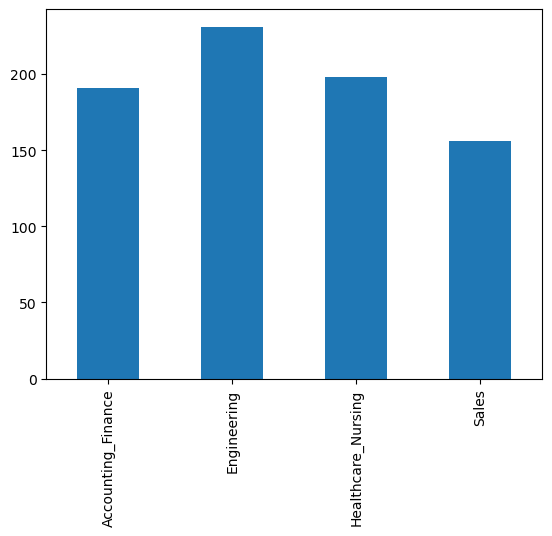

In [20]:
labels_df = pd.DataFrame({'Category': Category})
stats = labels_df['Category'].value_counts().sort_index()
print(stats)
stats.plot.bar(ylim=0)

###  Description of the job advertisement 

The below code constructs and assesses the performance of a logistic regression model for categorizing job advertisements. It utilizes the TF-IDF feature representation computed in Task 2 as the input data for the model. Additionally, the code showcases the implementation of a 5-fold cross-validation technique. This approach aims to achieve a more reliable and comprehensive evaluation of the model's predictive capabilities by training and testing it on multiple subsets of the data. Cross-validation helps mitigate potential biases that may arise from using a single train-test split, thereby providing a more robust estimate of the model's generalization performance.

In [21]:
seed = 0

### TF-IDF weighted 

In [22]:
X_train, X_test, y_train, y_test,train_indices,test_indices = train_test_split(tfidf_features, Category, list(range(0,len(Category))),test_size=0.33, random_state=seed)
model = LogisticRegression(random_state=seed)
model.fit(X_train, y_train)
model.score(X_test, y_test)

0.8949416342412452

Import the necessary modules and classes from the scikit-learn library. `train_test_split` is used for splitting the data into training and test sets, `LogisticRegression` is the machine learning model for classification, and `StratifiedKFold` and `cross_val_score` are used for performing cross-validation.
This line splits the data (`tfidf_features` and `Category`) into training and test sets. The `train_test_split` function takes the feature matrix (`tfidf_features`), target variable (`Category`), and a list of indices (to preserve the correspondence between data points and their indices). It splits the data into training and test sets, with 33% of the data used for testing (`test_size=0.33`). The `random_state` parameter ensures reproducibility of the split.
These lines create a logistic regression model with a fixed random state, fit the model on the training data (`X_train`, `y_train`), and evaluate the model's accuracy on the test data (`X_test`, `y_test`) using the `score` method.


In [23]:
num_folds = 5
kf = KFold(n_splits= num_folds, random_state=seed, shuffle = True) # initialise a 5 fold validation
print(kf)

KFold(n_splits=5, random_state=0, shuffle=True)


Then Import the `KFold` class from scikit-learn and create a 5-fold cross-validation object (`kf`). The `KFold` class is used to generate indices for the training and validation sets in each fold. The `random_state` parameter ensures reproducibility, and `shuffle=True` ensures that the data is shuffled before splitting.


In [24]:
DW_scores = cross_val_score(model, tfidf_features, Category, cv= 5, scoring='accuracy')
DW_scores

array([0.90384615, 0.89032258, 0.92903226, 0.85806452, 0.90322581])

This performs 5-fold cross-validation on the logistic regression model using the `cross_val_score` function. It takes the model, feature matrix (`tfidf_features`), target variable (`Category`), the number of folds (`cv=5`), and the scoring metric (`scoring='accuracy'`). The function returns an array of accuracy scores for each fold, which is stored in the `scores` variable and printed.

By performing cross-validation, you can obtain a more robust estimate of the model's performance, as it evaluates the model on multiple train-test splits of the data. This helps to mitigate the potential bias introduced by a single train-test split and provides a better understanding of the model's generalization ability.

In [25]:
tfidf_features.shape

(776, 5168)

### count vector

In [26]:
count_features = cVectorizer.fit_transform(descriptions) # generate the count vector representation for all articles
count_features

<776x5168 sparse matrix of type '<class 'numpy.int64'>'
	with 62700 stored elements in Compressed Sparse Row format>

In [27]:
X_train, X_test, y_train, y_test = train_test_split(count_features, Category, test_size=0.33, random_state=seed)
model = LogisticRegression(random_state=seed)
model.fit(X_train, y_train)
model.score(X_test, y_test)

0.8832684824902723

In [28]:
DCV_scores = cross_val_score(model, count_features, Category, cv= 5, scoring='accuracy')
DCV_scores

array([0.88461538, 0.87096774, 0.87741935, 0.84516129, 0.89032258])

### unweighted vector

The code is for building and evaluating a logistic regression model for job advertisement classification using the unweighted document embeddings generated in Task 2 as the feature representation.


1. `X_train, X_test, y_train, y_test = train_test_split(unweighted_vectors, Category, test_size=0.33, random_state=seed)`
   - I split the data (`unweighted_vectors` and `Category`) into training and test sets using the `train_test_split` function.
   - The `unweighted_vectors` are used as the feature matrix, and `Category` is the target variable.
   - I set `test_size=0.33` to allocate 33% of the data for testing, and the remaining 67% for training.
   - The `random_state` parameter ensures reproducibility of the split.

2. `model = LogisticRegression(random_state=seed)`
   - I created an instance of the `LogisticRegression` model from scikit-learn.
   - Setting `random_state=seed` ensures reproducibility of the model's initialization.

3. `model.fit(X_train, y_train)`
   - I trained the logistic regression model on the training data (`X_train`, `y_train`).

4. `model.score(X_test, y_test)`
   - I evaluated the trained model's accuracy on the test data (`X_test`, `y_test`) using the `score` method.

5. `DUWscores = cross_val_score(model, unweighted_vectors, Category, cv=5, scoring='accuracy')`
   - I performed 5-fold cross-validation on the logistic regression model using the `cross_val_score` function.
   - The `unweighted_vectors` are used as the feature matrix, and `Category` is the target variable.
   - I set `cv=5` to perform 5-fold cross-validation.
   - The `scoring='accuracy'` parameter specifies that you want to evaluate the model's accuracy.
   - The cross-validation scores are stored in the `scores` variable.

6. `DUW_scores`
   - I printed the cross-validation scores.

The reason I did this is to evaluate the performance of the logistic regression model for job advertisement classification using the unweighted document embeddings as the feature representation. By performing cross-validation, you can obtain a more robust estimate of the model's performance, as it evaluates the model on multiple train-test splits of the data, mitigating potential biases introduced by a single train-test split.


In [29]:
X_train, X_test, y_train, y_test = train_test_split(unweighted_vectors, Category, test_size=0.33, random_state=seed)
model = LogisticRegression(random_state=seed)
model.fit(X_train, y_train)
model.score(X_test, y_test)

0.8754863813229572

In [30]:
DUW_scores = cross_val_score(model, unweighted_vectors, Category, cv= 5, scoring='accuracy')
DUW_scores

array([0.91025641, 0.85806452, 0.89032258, 0.80645161, 0.89032258])

### Title of the job advertisement

Building and evaluating a logistic regression model for job advertisement classification using the TF-IDF feature representation of the preprocessed job titles.

1. `titles = [job['title'] for job in job_ads]`
   - Extracted the job titles from the `job_ads` data, which is assumed to be a list of dictionaries representing job advertisements.

2. `import re` and `pattern = r'\b\w+\b'`
   - Imported the `re` module for regular expressions and defined a pattern `r'\b\w+\b'` to match word tokens.

3. `pro_titles = []` and `for title in titles: ...`
   - Preprocessed the job titles by tokenizing them using the regular expression pattern and joining the tokens back into preprocessed titles (`pro_titles`).

In [31]:
titles = [job['title'] for job in job_ads]

In [32]:

pattern = r'\b\w+\b'
pro_titles = []

for title in titles:
    tokens = re.findall(pattern, title)
    pro_title = " ".join(tokens)
    pro_titles.append(pro_title)

print(pro_titles)


['Finance Accounts Asst Bromley to k', 'Fund Accountant Hedge Fund', 'Deputy Home Manager', 'Brokers Wanted Imediate Start', 'RGN Nurses Hospitals Penarth', 'Production Coordinator', 'Scrub Nurse', 'Sales Purchase Ledger Clerk Maternity Cover', 'Recruitment Sales Executive', 'Business Development Executive Field Sales Dartford', 'Investments Treasury Controller', 'European Payroll', 'Engineering Assessor Instructor South Yorkshire', 'International Account Manager', 'Senior Production Technologist Malaysia', 'Insurance Sales Executive Horsham', 'Vehicle Purchaser Car Sales', 'Marine Engines Specialist Product Support', 'Sales Manager Medical Sales Executive', 'Optical Assistant Oxfordshire', 'PERM Unit Mgr RGN Kid minster Flexi K due', 'PERM RGN s in Bangor CoDown F T Flexi ph ExOpp Bangor', 'Ecommerce Country Manager Netherlands', 'Business Development Manager Leading Financial Lending PLC', 'Dynamics AX Finance Consultant London c k', 'Nursing Home Manager Crawley', 'Registered Mental

### TF-IDF weighted for Title

4. `tVectorizer = TfidfVectorizer(analyzer="word", vocabulary=vocab)`
   - Initialized a `TfidfVectorizer` from scikit-learn, setting the `analyzer` to "word" and using the `vocabulary` generated in Task 1.

5. `tfidf_features = tVectorizer.fit_transform(pro_titles)`
   - Generated the TF-IDF feature representation (`tfidf_features`) for the preprocessed job titles (`pro_titles`).

6. `X_train, X_test, y_train, y_test, ... = train_test_split(tfidf_features, Category, ...)`
   - Split the TF-IDF features (`tfidf_features`) and the target variable (`Category`) into training and test sets.

7. `model = LogisticRegression(random_state=seed)`
   - Created a logistic regression model with a fixed random state.

8. `model.fit(X_train, y_train)` and `model.score(X_test, y_test)`
   - Trained the logistic regression model on the training data and evaluated its accuracy on the test data.

9. `num_folds = 5` and `kf = KFold(n_splits=num_folds, random_state=seed, shuffle=True)`
   - Set up a 5-fold cross-validation strategy with a fixed random state and shuffling.

10. `TW_scores = cross_val_score(model, tfidf_features, Category, cv=5, scoring='accuracy')`
    - Performed 5-fold cross-validation on the logistic regression model using the TF-IDF features and the target variable, evaluating the model's accuracy.

The reason I did this is to investigate whether incorporating the job title information, in addition to the job description, can improve the classification accuracy for job advertisements. By generating TF-IDF feature representations for the preprocessed job titles and using them as input to the logistic regression model, I can evaluate the model's performance and compare it to the performance achieved using only the job description or a combination of job title and description.

Performing cross-validation provides a more robust estimate of the model's performance by evaluating it on multiple train-test splits of the data, mitigating potential biases introduced by a single train-test split.

In [33]:
tVectorizer = TfidfVectorizer(analyzer = "word",vocabulary = vocab) # initialised the TfidfVectorizer
tfidf_features = tVectorizer.fit_transform(pro_titles) # generate the tfidf vector representation for all articles
tfidf_features.shape

(776, 5168)

In [34]:
X_train, X_test, y_train, y_test,train_indices,test_indices = train_test_split(tfidf_features, Category, list(range(0,len(Category))),test_size=0.33, random_state=seed)
model = LogisticRegression(random_state=seed)
model.fit(X_train, y_train)
model.score(X_test, y_test)

0.7626459143968871

In [35]:
num_folds = 5
kf = KFold(n_splits= num_folds, random_state=seed, shuffle = True) # initialise a 5 fold validation
print(kf)

KFold(n_splits=5, random_state=0, shuffle=True)


In [36]:
TW_scores = cross_val_score(model, tfidf_features, Category, cv= 5, scoring='accuracy')
TW_scores

array([0.74358974, 0.78064516, 0.8       , 0.71612903, 0.76774194])

### unweighted vector for Title

Building and evaluating a logistic regression model for job advertisement classification using the unweighted document embeddings of the preprocessed job titles as the feature representation.


1. `unweighted_vectors = [get_average_vector(title, W2V) for title in pro_titles]`
   - Generated unweighted document embeddings (`unweighted_vectors`) for the preprocessed job titles (`pro_titles`) using the `get_average_vector` function and the pre-trained Word2Vec model (`W2V`).
   - This step creates a list of unweighted document embeddings, where each embedding is the average of the word embeddings for the tokens in the corresponding job title.

2. `X_train, X_test, y_train, y_test, ... = train_test_split(unweighted_vectors, Category, ...)`
   - Split the unweighted document embeddings (`unweighted_vectors`) and the target variable (`Category`) into training and test sets.

3. `model = LogisticRegression(random_state=seed)`
   - Created a logistic regression model with a fixed random state.

4. `model.fit(X_train, y_train)` and `model.score(X_test, y_test)`
   - Trained the logistic regression model on the training data and evaluated its accuracy on the test data.

5. `scores = cross_val_score(model, tfidf_features, Category, cv=5, scoring='accuracy')`
   - Performed 5-fold cross-validation on the logistic regression model using the TF-IDF features (`tfidf_features`) of the job descriptions and the target variable (`Category`), evaluating the model's accuracy.

The reason for diong this is to investigate whether using the unweighted document embeddings of the job titles as input features can improve the classification accuracy for job advertisements, compared to using only the job descriptions or the TF-IDF feature representation of the job titles.

By generating unweighted document embeddings for the job titles using the pre-trained Word2Vec model, we captured the semantic information and context of the words in the titles. These embeddings can potentially provide a more meaningful representation of the job titles compared to the TF-IDF feature representation, which is based solely on word counts and frequencies.

You then split the unweighted document embeddings and the target variable into training and test sets, and train a logistic regression model on the training data. You evaluate the model's accuracy on the test data and perform 5-fold cross-validation using the TF-IDF features of the job descriptions.

By comparing the performance of the logistic regression model using different feature representations (TF-IDF of job titles, TF-IDF of job descriptions, unweighted document embeddings of job titles), you can investigate whether incorporating the job title information, and the type of feature representation used for the job titles, can improve the classification accuracy for job advertisements.

In [37]:
unweighted_vectors = [get_average_vector(title, W2V) for title in pro_titles]
unweighted_vectors

[array([-0.15618243,  0.09053693,  0.01682826,  0.12650844, -0.04933384,
        -0.02545602, -0.08345795, -0.06637137, -0.02773176,  0.01671491,
        -0.04567562, -0.05124119, -0.18022483,  0.05611747, -0.0998012 ,
         0.09418597,  0.08655875,  0.14152309, -0.03546306,  0.01773344,
        -0.20571463,  0.00673076,  0.10454423, -0.01867621, -0.06607928,
         0.01908636, -0.24527414,  0.06474195, -0.03441293, -0.00146484,
         0.00216838,  0.05336898, -0.04746573, -0.12773132, -0.11469923,
         0.12780762, -0.20784106,  0.12169102, -0.03638485,  0.08648682,
        -0.07379586, -0.03537423,  0.07863072,  0.09257725,  0.02844674,
        -0.00436558, -0.02941731, -0.13058036, -0.08687047,  0.10431344,
        -0.16778128,  0.22417341, -0.00255476,  0.23542132,  0.03626796,
         0.12069702, -0.09821429, -0.09899766, -0.0483878 , -0.10877337,
        -0.13022777, -0.08843776, -0.18267168, -0.06690928, -0.03527968,
        -0.17262486, -0.05504635,  0.12368338, -0.0

In [38]:
X_train, X_test, y_train, y_test,train_indices,test_indices = train_test_split(unweighted_vectors, Category, list(range(0,len(Category))),test_size=0.33, random_state=seed)
model = LogisticRegression(random_state=seed)
model.fit(X_train, y_train)
model.score(X_test, y_test)

0.5875486381322957

In [39]:
TUW_scores = cross_val_score(model, tfidf_features, Category, cv= 5, scoring='accuracy')
TUW_scores

array([0.74358974, 0.78064516, 0.8       , 0.71612903, 0.76774194])

###  Title and Description of the job advertisement



Preprocessing the job advertisement data by combining the job title and job description into a single text, and then tokenizing and cleaning the combined text.

1. `combined_texts = []`
   - This line initializes an empty list `combined_texts` to store the combined job title and description texts.

2. `for job in job_ads:`
   `    if 'title' in job and 'description' in job:`
   `        combined_text = f"{job['title']} {job['description']}"`
   `        combined_texts.append(combined_text)`
   - This loop iterates over each job advertisement in the `job_ads` list.
   - For each job advertisement, it checks if the 'title' and 'description' keys exist in the dictionary.
   - If both keys exist, it concatenates the job title and job description into a single string `combined_text` using an f-string.
   - The `combined_text` is then appended to the `combined_texts` list.

3. `combined_texts`
   - This line prints the `combined_texts` list, which now contains the combined job title and description texts for each job advertisement.

4. `pattern = r'\b\w+\b'`
   - This line defines a regular expression pattern `r'\b\w+\b'` to match word tokens.

5. `combined_words = []`
   - This line initializes an empty list `combined_words` to store the tokenized and cleaned combined texts.

6. `for combined_text in combined_texts:`
   `    tokens = re.findall(pattern, combined_text)`
   `    combined_word = " ".join(tokens)`
   `    combined_words.append(combined_word)`
   - This loop iterates over each combined text in the `combined_texts` list.
   - For each combined text, it uses the `re.findall` function to find all matches of the regular expression pattern `pattern` in the text.
   - The matched tokens (words) are stored in the `tokens` list.
   - The `tokens` list is then joined with spaces using `" ".join(tokens)` to create a cleaned and tokenized combined text `combined_word`.
   - The cleaned and tokenized combined text `combined_word` is appended to the `combined_words` list.

7. `print(combined_words)`
   - This line prints the `combined_words` list, which now contains the cleaned and tokenized combined job title and description texts for each job advertisement.

this is to preprocess the job advertisement data by combining the job title and job description into a single text, and then tokenizing and cleaning the combined text. This preprocessing step is often necessary for feature extraction and modeling tasks, as it helps to clean and standardize the text data.

By combining the job title and job description, we create a single text representation that incorporates information from both sources. This combined text can then be used to generate feature representations (e.g., count vectors, word embeddings) and build classification models that leverage the information from both the job title and job description.

The tokenization and cleaning step, using the regular expression pattern `\b\w+\b`, removes any non-word characters and separates the words in the combined text. This can improve the quality of the feature representations and potentially lead to better model performance.

The cleaned and tokenized combined texts in `combined_words` can then be used for generating feature representations and building classification models that incorporate both the job title and job description information.

In [40]:
combined_texts = []
for job in job_ads:
    if 'title' in job and 'description' in job:
        combined_text = f"{job['title']} {job['description']}"
        combined_texts.append(combined_text)


In [41]:
pattern = r'\b\w+\b'
combined_words = []

for combined_text in combined_texts:
    tokens = re.findall(pattern, combined_text)
    combined_word = " ".join(tokens)
    combined_words.append(combined_word)



### TF-IDF weighted for Title and Description


In [42]:
tVectorizer = TfidfVectorizer(analyzer = "word",vocabulary = vocab) # initialised the TfidfVectorizer
tfidf_features = tVectorizer.fit_transform(combined_words) # generate the tfidf vector representation for all articles
tfidf_features.shape

(776, 5168)

In [43]:
X_train, X_test, y_train, y_test,train_indices,test_indices = train_test_split(tfidf_features, Category, list(range(0,len(Category))),test_size=0.33, random_state=seed)
model = LogisticRegression(random_state=seed)
model.fit(X_train, y_train)
model.score(X_test, y_test)

0.9027237354085603

In [44]:
TDW_scores = cross_val_score(model, tfidf_features, Category, cv= 5, scoring='accuracy')
TDW_scores

array([0.90384615, 0.89677419, 0.91612903, 0.85806452, 0.90967742])

###  unweighted for Title and Description


In [45]:
unweighted_vectors = [get_average_vector(combined_word, W2V) for combined_word in combined_words]
unweighted_vectors

[array([-1.74510580e-01,  1.10217001e-01, -9.49428736e-03,  1.37169082e-01,
        -7.76396440e-02,  1.36861060e-02, -8.55896312e-02, -5.05181347e-02,
        -5.45458225e-02,  1.99286110e-02, -4.97540785e-02, -9.67815182e-02,
        -2.17016032e-01,  4.21363949e-02, -1.22797674e-01,  9.84971437e-02,
         9.70391387e-02,  1.79555942e-01, -2.00699327e-02, -1.56410494e-03,
        -2.43757969e-01, -2.91285935e-02,  1.24970154e-01, -8.64238443e-03,
        -9.59894447e-02,  3.27636121e-02, -2.75488028e-01,  6.88657612e-02,
        -4.93968904e-02, -2.25245817e-02,  4.80754635e-03,  3.51562895e-02,
        -6.74892287e-02, -1.27842404e-01, -1.51373591e-01,  1.00231586e-01,
        -2.25874906e-01,  1.19074214e-01, -5.71973237e-02,  8.85658067e-02,
        -4.50616550e-02, -5.81389906e-02,  6.55701000e-02,  1.00329305e-01,
         4.81901366e-02, -2.16667047e-02, -2.01677313e-02, -1.67609496e-01,
        -1.21849574e-01,  9.06232923e-02, -1.75564623e-01,  2.39351421e-01,
        -3.1

In [46]:
X_train, X_test, y_train, y_test,train_indices,test_indices = train_test_split(unweighted_vectors, Category, list(range(0,len(Category))),test_size=0.33, random_state=seed)
model = LogisticRegression(random_state=seed)
model.fit(X_train, y_train)
model.score(X_test, y_test)

0.3852140077821012

In [47]:
TDUW_scores = cross_val_score(model, unweighted_vectors, Category, cv= 5, scoring='accuracy')
TDUW_scores

array([0.37179487, 0.38709677, 0.35483871, 0.37419355, 0.37419355])

#### PLOT

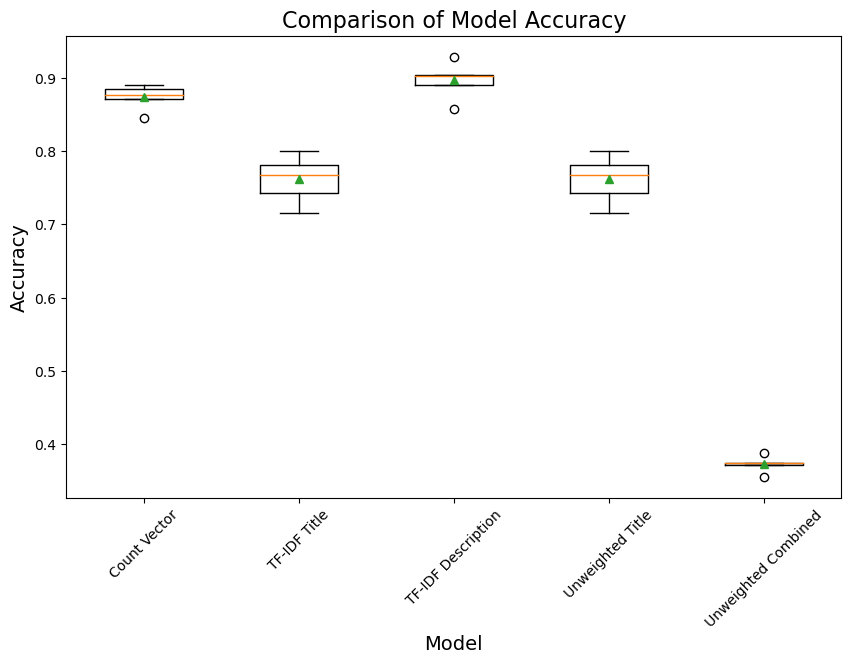

In [48]:
import matplotlib.pyplot as plt

model_names = ['Count Vector', 'TF-IDF Title', 'TF-IDF Description', 'Unweighted Title', 'Unweighted Combined']

accuracy_scores = [DCV_scores, TW_scores, DW_scores, TUW_scores, TDUW_scores]

x_pos = range(len(model_names))

fig, ax = plt.subplots(figsize=(10, 6))

ax.boxplot(accuracy_scores, labels=model_names, showmeans=True)

ax.set_title('Comparison of Model Accuracy', fontsize=16)
ax.set_xlabel('Model', fontsize=14)
ax.set_ylabel('Accuracy', fontsize=14)

plt.xticks(rotation=45)

plt.show()

## Summary


To summarize, using the Word2Vec (GoogleNews-300) model you loaded, you need to generate the following three types of feature representations for each job advertisement description:

1. Count Vector Representation (saved in `count_vectors.txt`)
2. TF-IDF Weighted Document Embedding
3. Unweighted Document Embedding

These feature representations capture different aspects of the text and can be useful for various natural language processing tasks, such as text classification, clustering, or information retrieval.

Task 3 involved building and evaluating machine learning models for job advertisement classification, investigating the impact of different feature representations (language models) and additional information (job title) on the classification performance.